# Lab 6 Report: 
## Audio Filtering with Gated RNNs

### Name:

In [1]:
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt
import torch
import seaborn as sns
import IPython

from scipy.io.wavfile import write

In [2]:
from IPython.display import Image # For displaying images in colab jupyter cell

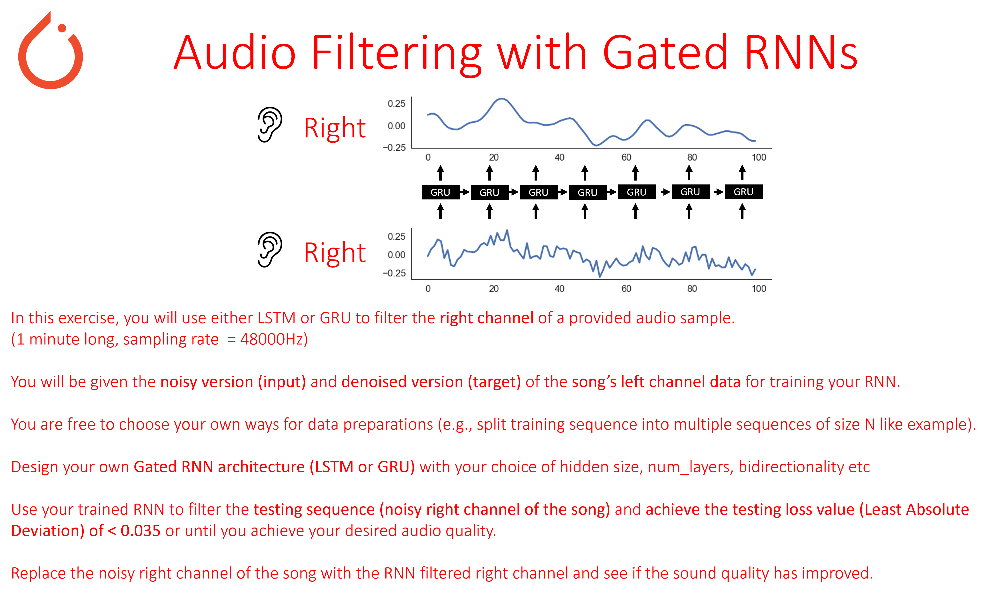

In [3]:
Image('lab6_exercise.png', width = 1000)

In [4]:
sns.set(style = 'white', font_scale = 1.5)

## Prepare Data

In [5]:
# Listen to audio with noisy right channel
# Our goal is to use RNN to denoise the right channel
# USE HEADPHONES OR SET YOUR LAPTOP VOLUME TO LOW IF YOU ARE LISTENING IN THE CLASS

import IPython
IPython.display.Audio("TSR_noisy.wav")

In [6]:
train_input_seqs = np.load('audio_train_inputs.npy') # Noisy left channel audio (training inputs to your RNN)
train_output_seqs = np.load('audio_train_targets.npy') # Ground truth left channel audio (trining targets for your RNN)

# Print the length of training features and targets
print(len(train_features), len(train_targets))

NameError: name 'train_features' is not defined

In [ ]:
# Reshape train_input_seqs and train_output_seqs to 2D arrays
# Each row corresponds to a single training input/target sequence
# e.g., if your training sequence length = 100 -> train_input_seqs/output_seqs should have shape (27540, 100)
# Feel free to choose your own training sequence length

# YOUR CODE HERE

In [ ]:
# Reshape train_input_seqs and output_seqs again to conform to PyTorch (sample size (N), sequence length, # of features)

# YOUR CODE HERE

In [ ]:
# let's plot one of the training input sequence/output target (10th sample)
# Feel free to plot a different sample

plt.figure(figsize = (10, 5))

plt.plot(train_input_seqs[10], label ='Noisy', linewidth = 3)
plt.plot(train_output_seqs[10], label ='Ground Truth', linewidth = 3)
plt.legend()
sns.despine()

## Define Model

In [ ]:
class Denoiser_RNN(torch.nn.Module):
    
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        
        super(Denoiser_RNN, self).__init__()
        
        # YOUR CODE HERE
        
    def forward(self, input_seq, hidden_state):
        
        # YOUR CODE HERE
        
        return denoised_seq

## Define Hyperparameters

In [ ]:
# Define your model
denoiser_rnn = # YOUR CODE HERE

# Define lr and epochs
learning_rate = # YOUR CODE HERE      
epochs = # YOUR CODE HERE

# Define mini-batch size
batchsize = # YOUR CODE HERE

# Use L1Loss to minimize least absolute deviation + optimizer
loss_func = torch.nn.L1Loss()
optimizer = # YOUR CODE HERE

# Print out model specifics, add .cuda() if using GPU
denoiser_rnn

## Identify Tracked Values

In [ ]:
# Empty list to keep track of training loss

train_loss_list = []

## Train Model

In [ ]:
# Convert your training data into torch tensors

# YOUR CODE HERE

# Split your training data into mini-batches

# YOUR CODE HERE

for epoch in range(epochs):
    
    for # mini-batch # YOUR CODE HERE
    
        # YOUR CODE HERE

    print("Averaged Training Loss for Epoch ", epoch,": ", np.mean(train_loss_list[-batch_split_num:]))

## Visualize & Evaluate Model

### Visualizing Training Loss

In [ ]:
# Plot your training loss throughout the training 

plt.figure(figsize = (13, 5))

plt.plot(train_loss_list, linewidth = 3, label = 'Training Loss')
plt.plot(np.convolve(train_loss_list, np.ones(100), 'valid') / 100, 
         linewidth = 3, label = 'Rolling Averaged Training Loss')

plt.ylabel("training loss")
plt.xlabel("Iterations")
plt.legend()
sns.despine()

### Computing Testing Loss

In [ ]:
# Load test features (Noisy right channel) and test targets for computing the test loss

test_input_seqs = np.load('audio_test_inputs.npy') # Noisy right channel audio (to be used as inputs to your trained RNN)
test_output_seqs = np.load('audio_test_targets.npy') # Groundtruth right channel audio (to compute the test loss)

In [ ]:
# Test features/targets have same dimension as training feature/targets

print(len(test_input_seqs), len(test_output_seqs))

In [ ]:
# Convert your test_input_seqs and output_seqs into torch tensors
# YOUR CODE HERE

# Reshape your test_input_seqs and output_seqs to 2D arrays as you did with train_input_seqs and output_seqs
# YOUR CODE HERE

# Reshape the test_input_seqs and output_seqs again to conform to (sample size (N), sequence length, # of features)
# YOUR CODE HERE

In [ ]:
# Each noisy test input sequence is fed into your trained RNN to produce denoised outputs
# We need to take mini-batch approach since our test_features is too big to feed it all in once (i.e. not enough memory)

# Split the test_features and targets to mini-batches
test_batches_features = torch.split(test_input_seqs, batchsize)
test_batches_targets = torch.split(test_output_seqs, batchsize)

batch_split_num_test = len(test_batches_features)

# Empty lists to keep track of RNN denoised test sequences and test losses
test_prediction = []
test_losses = []

# Turn on no_grad() since we aren't performing backprop during this process
with torch.no_grad():
    
    for k in range(batch_split_num_test):
        
        # Feed in k-th test mini-batch to trained RNN
        test_pred = denoiser_rnn(test_batches_features[k], None)
        # Compre the test_pred with test target sequence to compute testing loss
        test_loss = loss_func(test_pred, test_batches_targets[k])
        
        # Use torch.squeeze() to make test_pred to shape (batchsize, seq_len) and convert it to numpy array
        test_pred_numpy = torch.squeeze(test_pred).numpy()
        
        # Append both test_pred_numpy and test_loss 
        test_prediction.append(test_pred_numpy)
        test_losses.append(test_loss.item())
        
# Final testing loss is the average of all the test_losses from mini-batches        
print("Testing Loss (Least Absolute Deviations): ", np.mean(test_losses))

### Creating a new audio with denoised right channel sequence

In [ ]:
# test_prediction is a list of 2D arrays where each array has shape (batchsize, seq_len)
# Vertically stack all appended 2D arrays so that we have a single 2D array
test_prediction = np.vstack(test_prediction)

In [ ]:
# We can visualize RNN denoised test sequence vs ground truth test sequence for particular sample
test_sample_num = # SOME INTEGER HERE
    
plt.figure(figsize = (10, 5))

plt.plot(test_prediction[test_sample_num], label='RNN Denoised', linewidth = 3)
plt.plot(test_output_seqs[test_sample_num], label='Groundtruth', linewidth = 3)
plt.legend()
plt.title("Testing Sample num: {}".format(sample_num))
sns.despine()

In [ ]:
# Reshape the test_prediction to 1D array of size 2754000 so that we can use it as the right channel of the song
# YOUR CODE HERE

# Reshape the train_output_seqs (ground truth left channel of the song) to 1D array as well
# YOUR CODE HERE

# Construct an array 'fixed_audio' of size (2754000, 2) 
# where the first column (left channel) is 1D reshaped train_output_seqs (groundtruth left channel)
# And second column (right channel) is the 1D reshaped test_prediction (RNN denoised)

fixed_audio = # YOUR CODE HERE

In [ ]:
# Scale the fixed_audio so that it's in int16 form and write it into a new audio file

scaled = np.int16(fixed_audio/np.max(np.abs(fixed_audio)) * 32767)
write('TSR_fixed.wav', 48000, scaled)

In [ ]:
# Listen to the new audio with denoised right channel
# USE HEADPHONES OR SET YOUR LAPTOP VOLUME TO LOW IF YOU ARE LISTENING IN THE CLASS

IPython.display.Audio("TSR_fixed.wav")

In [ ]:
# Compare your denoised audio with ground truth audio for reference
# USE HEADPHONES OR SET YOUR LAPTOP VOLUME TO LOW IF YOU ARE LISTENING IN THE CLASS

IPython.display.Audio("TSR.wav")